In [57]:

#conda install pip

In [58]:
#conda update -n base -c defaults conda

In [59]:
#conda install -c conda-forge jupyter_contrib_nbextensions

In [60]:
#pip install textblob

In [61]:
#!python -m pip install --upgrade pip

In [62]:
#pip install wordcloud

In [63]:
#pip install nltk

In [64]:
#pip install snscrape

In [65]:
#pip install emoji

# Importing Libraries

In [26]:
import numpy as np
import pandas as pd
import snscrape.modules.twitter as sntwitter
import seaborn as sns
import datetime 
import matplotlib.pyplot as plt

import nltk
#nltk.download() 
#nltk.download(["stopwords","twitter_samples","vader_lexicon"])
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer


import string
import re
import textblob
from textblob import TextBlob

from wordcloud import WordCloud, STOPWORDS
#porter = PorterStemmer()

#Lemmatization
lemmatizer = WordNetLemmatizer() 

#Wordcloud
from wordcloud import ImageColorGenerator
from PIL import Image

#import warnings
%matplotlib inline


In [2]:
#nltk.download('wordnet')
#nltk.download('omw-1.4')

In [3]:
#pip install git+https://github.com/JustAnotherArchivist/snscrape.git

# Data Collection

In [1]:
#Data collection from X social media platform using snnscrape Python library 
#search query
query = '(#chatgptacademics OR #chatgptacademics OR ChatGPTAcademicsConcerns OR ChatGPTExamCheating OR ChatGPTEthics OR ChatGPTImpactEducation OR ChatGPTPlagarism OR ChatGPTAcademicIssues OR ChatGPTIssuesOnEducation OR ChatGPTResearch OR #ChatGPTBan) since:2022-11-05 until:2023-06-28' 
#query = '(#chatgptacademics OR #chatgptacademics OR ChatGPTAcademicsConcerns) since:2022-11-22 until:2023-05-28' 
tweets = []
#Looping
for n, tweet in enumerate(sntwitter.TwitterSearchScraper(query, maxEmptyPages=500).get_items()):
    if n>100000:
         break
    else:
        if tweet.lang=='en':
            tweets.append([tweet.date, tweet.id, tweet.user.username, tweet.sourceLabel, tweet.user.location, tweet.rawContent, tweet.likeCount, tweet.retweetCount])
#Save the data in a dataframe
df = pd.DataFrame(tweets, columns = ['Date', 'ID', 'Username', 'Source', 'Location', 'Tweet', 'Likes', 'Retweet'])
df.to_csv('ChatGPT_Education.csv', mode ='a') 

In [33]:
df.tail(5)

,Date,ID,Username,Source,Location,Tweet,Likes,Retweet
67,2023-01-31 01:48:45+00:00,1620237617622298624,Pra88845317Hara,None,"Bhanjanagar, India",OnePlus doesn't allow chatgpt #oneplus11r #one...,0,0
68,2023-01-30 13:11:36+00:00,1620047074246139905,GauravT25244818,None,"Bengaluru, India",Is ChatGPT Going to Be Banned in the USA?\n🧐🧐\...,1,0
69,2023-01-29 02:16:52+00:00,1619519918080249856,dellyranksindia,None,"New Delhi, India",ChatGPT Usage Banned in French University Over...,0,0
70,2023-01-28 11:24:02+00:00,1619295228137201666,hopeofhardik,None,"Ahmadabad City, India",ChatGPT Ban in French University \n\nAate hi M...,6,0
71,2023-01-05 14:11:59+00:00,1611002574592958464,TakiSpondon,None,Bangladesh,NYC Bans Students and Teachers from Using Chat...,2,0


# Data Pre-Processing

In [93]:
#Read the csv file using panda library: ChatGPT_Education_Newest from snscrape
df1 = pd.read_csv('ChatGPT_Education_Newest.csv' , encoding = 'unicode_escape') 

In [94]:
#Read the csv file using panda library: ChatGPT_Education1 from snscrape 
df2= pd.read_csv('ChatGPT_Education1.csv' , encoding = 'unicode_escape') 

In [95]:
#Read the csv file using panda library: ChatGPT_Kaggle from Kaggle Website
df3 = pd.read_csv('ChatGPT_Kaggle.csv', low_memory=False) 

In [96]:
df1.tail(3) #ChatGPT_Education_Newest from snscrape

,Unnamed: 0,Date,ID,Username,Source,Location,Tweet,Likes,Retweet
19600,69.0,2023-01-29 02:16:52+00:00,1.61952E+18,dellyranksindia,NaN,"New Delhi, India",ChatGPT Usage Banned in French University Over...,0,0
19601,70.0,2023-01-28 11:24:02+00:00,1.6193E+18,hopeofhardik,NaN,"Ahmadabad City, India",ChatGPT Ban in French University \n\nAate hi M...,6,0
19602,71.0,2023-01-05 14:11:59+00:00,1.611E+18,TakiSpondon,NaN,Bangladesh,NYC Bans Students and Teachers from Using Chat...,2,0


In [97]:
df1.shape

(19603, 9)

In [98]:
df2.tail(3) #ChatGPT_Education1 from snscrape

,Unnamed: 0,Date,ID,Username,Source,Location,Tweet,Likes,Retweet
328,12,2023-01-26 18:25:37+00:00,1.618680e+18,abt_live,Revive Social App,India,Explained | Does ChatGPT have an ethics proble...,0,0
329,13,2023-01-26 12:23:11+00:00,1.618590e+18,wiseshot_,Twitter for Android,Portugal,What Challenges remain in learning with ChatGP...,1,0
330,14,2023-01-05 14:11:59+00:00,1.611000e+18,TakiSpondon,Twitter Web App,Bangladesh,NYC Bans Students and Teachers from Using Chat...,2,0


In [99]:
df2.shape

(331, 9)

In [100]:
df3.tail(3) #ChatGPT_Kaggle from Kaggle Website

,Date,ID,Username,Source,Location,Tweet,Likes,Retweet
500063,2023-01-04 07:17:20+00:00,1.61E+18,mcp350,NaN,NaN,all my twitter feed is about ChatGPT and @Open...,3.0,1.0
500064,2023-01-04 07:17:08+00:00,1.61E+18,manumurali369,NaN,NaN,I'm quite amazed by Chat GPT. A really promisi...,1.0,0.0
500065,2023-01-04 07:16:56+00:00,1.61E+18,pnik91,NaN,NaN,I used chat gpt to get gym workout program and...,0.0,0.0


In [101]:
df3.Likes.isna().sum()

92

In [102]:
#fill null Likes with '0'
df3['Likes'] = df3['Likes'].fillna('0')
df3.Likes.isna().sum()

0

In [103]:
df3.Retweet.isna().sum()

92

In [104]:
df3['Retweet'] = df3['Retweet'].fillna('0')
df3.Retweet.isna().sum()

0

In [105]:
df3['Likes'] = df3['Likes'].astype(int)
df3['Retweet'] = df3['Retweet'].astype(int)

In [106]:
df3.tail(5)

,Date,ID,Username,Source,Location,Tweet,Likes,Retweet
500061,2023-01-04 07:18:08+00:00,1.61E+18,Pup_In_Cup,NaN,NaN,@GoogleAI #LAMDA Versus @OpenAI #ChatGPT ?! Wh...,1,0
500062,2023-01-04 07:17:50+00:00,1.61E+18,TryingToOffend,NaN,NaN,#ChatGPT \n\nSo much #Censorship.\n\nNever tru...,2,0
500063,2023-01-04 07:17:20+00:00,1.61E+18,mcp350,NaN,NaN,all my twitter feed is about ChatGPT and @Open...,3,1
500064,2023-01-04 07:17:08+00:00,1.61E+18,manumurali369,NaN,NaN,I'm quite amazed by Chat GPT. A really promisi...,1,0
500065,2023-01-04 07:16:56+00:00,1.61E+18,pnik91,NaN,NaN,I used chat gpt to get gym workout program and...,0,0


In [107]:
df3.shape

(500066, 8)

In [108]:
# Concatenate vertically the three Dataset
df = pd.concat([df1, df2,df3])


In [109]:
#save the csv file
df.to_csv(f'..//df_alldataset.csv')

In [35]:
df.head(5)

,Unnamed: 0,Date,ID,Username,Source,Location,Tweet,Likes,Retweet
0,0.0,2023-03-16 23:25:50+00:00,1.63651E+18,logomentary,Twitter Web App,United States,Will you be subscribing to Poe's paid tier?Get...,0,0
1,1.0,2023-03-16 21:43:47+00:00,1.63648E+18,financeideas89,Twitter Web App,Dhaka-Bangladesh,#ElonMusk fumes over #OpenAI becoming â$30B ...,1,0
2,2.0,2023-03-16 17:14:50+00:00,1.63642E+18,ousmaneba,Twitter for iPhone,Canada,With chatGPT4 the World will never be the same...,1,0
3,3.0,2023-03-16 17:05:11+00:00,1.63641E+18,bdtech24info,Twitter Web App,Bangladesh,A Look Inside AutoBlog GPT: Reviewing the AI-D...,0,0
4,4.0,2023-03-16 17:02:32+00:00,1.63641E+18,bdtech24info,Twitter Web App,Bangladesh,Say Goodbye to Writer's Block with AutoBlog GP...,0,0


In [36]:
#Description about the CSV files 
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 520000 entries, 0 to 500065
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Unnamed: 0  19856 non-null   float64
 1   Date        519970 non-null  object 
 2   ID          519964 non-null  object 
 3   Username    519936 non-null  object 
 4   Source      19150 non-null   object 
 5   Location    13879 non-null   object 
 6   Tweet       519964 non-null  object 
 7   Likes       520000 non-null  object 
 8   Retweet     519999 non-null  object 
dtypes: float64(1), object(8)
memory usage: 39.7+ MB


,Unnamed: 0
count,19856.000000
mean,412.241942
std,267.246981
min,0.000000
25%,172.000000
50%,408.500000
75%,645.000000
max,885.000000


In [37]:
#Nunber of rows and columns
df.shape

(520000, 9)

In [38]:
#check for null
df.isnull().sum()

Unnamed: 0    500144
Date              30
ID                36
Username          64
Source        500850
Location      506121
Tweet             36
Likes              0
Retweet            1
dtype: int64

In [39]:
df.Location.isna().sum()

506121

In [40]:
df.Source.isna().sum()

500850

In [41]:
#fill null Source with 'Unknown'
df['Source'] = df['Source'].fillna('Unknown')

In [42]:
df.Source.isna().sum()

0

In [43]:
#fill null location with 'Unknown'
df['Location'] = df['Location'].fillna('Unknown')

In [44]:
df.Location.isna().sum()

0

In [45]:
#fill null Likes with '0'
df['Likes'] = df['Likes'].fillna('0')

In [46]:
df.Likes.isna().sum()

0

In [47]:
#fill null Retweet with '0'
df['Retweet'] = df['Retweet'].fillna('0')

In [48]:
df.Retweet.isna().sum()

0

In [49]:
df.duplicated().sum()

15312

In [50]:
# Remove unnessary columns such as 'Unnamed' column, 'ID' and 'Username' for data privacy

df = df[['Date', 'Source', 'Location', 'Tweet','Likes', 'Retweet']]

In [51]:
df.tail(5)

,Date,Source,Location,Tweet,Likes,Retweet
500061,2023-01-04 07:18:08+00:00,Unknown,Unknown,@GoogleAI #LAMDA Versus @OpenAI #ChatGPT ?! Wh...,1,0
500062,2023-01-04 07:17:50+00:00,Unknown,Unknown,#ChatGPT \n\nSo much #Censorship.\n\nNever tru...,2,0
500063,2023-01-04 07:17:20+00:00,Unknown,Unknown,all my twitter feed is about ChatGPT and @Open...,3,1
500064,2023-01-04 07:17:08+00:00,Unknown,Unknown,I'm quite amazed by Chat GPT. A really promisi...,1,0
500065,2023-01-04 07:16:56+00:00,Unknown,Unknown,I used chat gpt to get gym workout program and...,0,0


In [52]:
# Remove duplicate tweets
df_noduplicate = df.drop_duplicates('Tweet')


In [53]:
df_noduplicate.shape

(494282, 6)

In [54]:
#Remove URL from tweet text
df_noduplicate['Tweet'] = df_noduplicate['Tweet'].apply(lambda x: re.sub(r'http\S+', '', str(x)))
#df_noduplicate['Tweet'] = df_noduplicate['Tweet'].apply(lambda x: re.sub(r'http\S+', '',x))
#Remove mention (@user)
df_noduplicate['Tweet'] = df_noduplicate['Tweet'].apply(lambda x: re.sub(r'@\w+', '',x))
#change text to lowercases
df_noduplicate['Tweet'] = df_noduplicate['Tweet'].apply(lambda x: ' '.join(x.lower() for x in x.split()))
#Remove Punctuation
df_noduplicate['Tweet_punc'] = df_noduplicate['Tweet'].apply(lambda x: re.sub('[^\w\s]', '', x))

/var/folders/t_/ss86n4l14xv5_ggs77cw756m0000gn/T/ipykernel_20718/1194305816.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_noduplicate['Tweet'] = df_noduplicate['Tweet'].apply(lambda x: re.sub(r'http\S+', '', str(x)))
/var/folders/t_/ss86n4l14xv5_ggs77cw756m0000gn/T/ipykernel_20718/1194305816.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_noduplicate['Tweet'] = df_noduplicate['Tweet'].apply(lambda x: re.sub(r'@\w+', '',x))
/var/folders/t_/ss86n4l14xv5_ggs77cw756m0000gn/T/ipykernel_20718/1194

In [55]:
df_noduplicate.head(10)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_punc
0,2023-03-16 23:25:50+00:00,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,will you be subscribing to poes paid tierget r...
1,2023-03-16 21:43:47+00:00,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,elonmusk fumes over openai becoming â30b marke...
2,2023-03-16 17:14:50+00:00,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,with chatgpt4 the world will never be the same...
3,2023-03-16 17:05:11+00:00,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,a look inside autoblog gpt reviewing the aidri...
4,2023-03-16 17:02:32+00:00,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,say goodbye to writers block with autoblog gpt...
5,2023-03-16 17:01:51+00:00,Twitter Web App,Bangladesh,transform your blog with ai: a review of autob...,0,0,transform your blog with ai a review of autobl...
6,2023-03-16 17:01:35+00:00,Twitter Web App,Bangladesh,autoblog gpt vs. traditional blogging: which i...,0,0,autoblog gpt vs traditional blogging which is ...
7,2023-03-16 16:57:40+00:00,Twitter Web App,Bangladesh,autoblog gpt: the key to unlocking efficiency ...,0,0,autoblog gpt the key to unlocking efficiency a...
8,2023-03-16 16:57:22+00:00,Twitter Web App,Bangladesh,the benefits of autoblog gpt: a review of the ...,0,0,the benefits of autoblog gpt a review of the a...
9,2023-03-16 16:56:02+00:00,Twitter Web App,Bangladesh,revamp your blogging strategy with autoblog gp...,0,0,revamp your blogging strategy with autoblog gp...


In [56]:
#Remove stopwords
stop = stopwords.words('english')
df_noduplicate['Tweet_stop'] =df_noduplicate['Tweet_punc'].apply(lambda x: ' '.join(x for x in x.split() if x not in stop))

/var/folders/t_/ss86n4l14xv5_ggs77cw756m0000gn/T/ipykernel_20718/2173516276.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_noduplicate['Tweet_stop'] =df_noduplicate['Tweet_punc'].apply(lambda x: ' '.join(x for x in x.split() if x not in stop))


In [57]:
df_noduplicate.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_punc,Tweet_stop
0,2023-03-16 23:25:50+00:00,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,will you be subscribing to poes paid tierget r...,subscribing poes paid tierget ready upgrade qu...
1,2023-03-16 21:43:47+00:00,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,elonmusk fumes over openai becoming â30b marke...,elonmusk fumes openai becoming â30b market pro...
2,2023-03-16 17:14:50+00:00,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,with chatgpt4 the world will never be the same...,chatgpt4 world never current version chatgpt b...
3,2023-03-16 17:05:11+00:00,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,a look inside autoblog gpt reviewing the aidri...,look inside autoblog gpt reviewing aidriven bl...
4,2023-03-16 17:02:32+00:00,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,say goodbye to writers block with autoblog gpt...,say goodbye writers block autoblog gpt indepth...


In [58]:
#Tokenization
df_noduplicate['Tweet_tokenized'] = df_noduplicate['Tweet_stop'].apply(lambda x: re.split('\W+', x))

/var/folders/t_/ss86n4l14xv5_ggs77cw756m0000gn/T/ipykernel_20718/3787278903.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_noduplicate['Tweet_tokenized'] = df_noduplicate['Tweet_stop'].apply(lambda x: re.split('\W+', x))


In [59]:
df_noduplicate.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_punc,Tweet_stop,Tweet_tokenized
0,2023-03-16 23:25:50+00:00,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,will you be subscribing to poes paid tierget r...,subscribing poes paid tierget ready upgrade qu...,"[subscribing, poes, paid, tierget, ready, upgr..."
1,2023-03-16 21:43:47+00:00,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,elonmusk fumes over openai becoming â30b marke...,elonmusk fumes openai becoming â30b market pro...,"[elonmusk, fumes, openai, becoming, â30b, mark..."
2,2023-03-16 17:14:50+00:00,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,with chatgpt4 the world will never be the same...,chatgpt4 world never current version chatgpt b...,"[chatgpt4, world, never, current, version, cha..."
3,2023-03-16 17:05:11+00:00,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,a look inside autoblog gpt reviewing the aidri...,look inside autoblog gpt reviewing aidriven bl...,"[look, inside, autoblog, gpt, reviewing, aidri..."
4,2023-03-16 17:02:32+00:00,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,say goodbye to writers block with autoblog gpt...,say goodbye writers block autoblog gpt indepth...,"[say, goodbye, writers, block, autoblog, gpt, ..."


In [60]:
#date column is converted to a datetime object, set errors='coerce'
df_noduplicate['Date'] = pd.to_datetime(df_noduplicate['Date'], errors='coerce')

#drop invalid dates
df_noduplicate = df_noduplicate.dropna(subset=['Date'])

# date component extracted is assigned to the 'date' column
df_noduplicate['Date'] = df_noduplicate['Date'].dt.date

# extracted date component is converted back to datetime object 
df_noduplicate['Date'] = pd.to_datetime(df_noduplicate['Date']).dt.normalize()




/var/folders/t_/ss86n4l14xv5_ggs77cw756m0000gn/T/ipykernel_20718/1019124570.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_noduplicate['Date'] = pd.to_datetime(df_noduplicate['Date'], errors='coerce')


In [61]:
df_noduplicate.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_punc,Tweet_stop,Tweet_tokenized
0,2023-03-16,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,will you be subscribing to poes paid tierget r...,subscribing poes paid tierget ready upgrade qu...,"[subscribing, poes, paid, tierget, ready, upgr..."
1,2023-03-16,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,elonmusk fumes over openai becoming â30b marke...,elonmusk fumes openai becoming â30b market pro...,"[elonmusk, fumes, openai, becoming, â30b, mark..."
2,2023-03-16,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,with chatgpt4 the world will never be the same...,chatgpt4 world never current version chatgpt b...,"[chatgpt4, world, never, current, version, cha..."
3,2023-03-16,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,a look inside autoblog gpt reviewing the aidri...,look inside autoblog gpt reviewing aidriven bl...,"[look, inside, autoblog, gpt, reviewing, aidri..."
4,2023-03-16,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,say goodbye to writers block with autoblog gpt...,say goodbye writers block autoblog gpt indepth...,"[say, goodbye, writers, block, autoblog, gpt, ..."


In [62]:
#Lemmatization
from nltk import pos_tag
from nltk.corpus import wordnet

In [63]:
#function to map POS tags from treebank tag into wordnet tags is defined
wordnet_lemma = WordNetLemmatizer()
def get_wordnet(pos):
    if pos.startswith('N'): 
        return wordnet.NOUN
    elif pos.startswith('V'):
        return wordnet.VERB
    elif pos.startswith('J'):
        return wordnet.ADJ
    elif pos.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN     # return default to noun if no match

    
# Define a function to tag and lemmatize a text string    
def lemmatizer(Tweet):
    pos_tags = pos_tag(Tweet)
    Tweet = [wordnet_lemma.lemmatize(word, pos = get_wordnet(pos)) for word, pos in pos_tags]
    return Tweet

df_noduplicate['Tweet_lemmatized'] = df_noduplicate['Tweet_tokenized'].apply(lambda x: lemmatizer(x))

In [64]:
df_noduplicate.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_punc,Tweet_stop,Tweet_tokenized,Tweet_lemmatized
0,2023-03-16,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,will you be subscribing to poes paid tierget r...,subscribing poes paid tierget ready upgrade qu...,"[subscribing, poes, paid, tierget, ready, upgr...","[subscribe, poe, pay, tierget, ready, upgrade,..."
1,2023-03-16,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,elonmusk fumes over openai becoming â30b marke...,elonmusk fumes openai becoming â30b market pro...,"[elonmusk, fumes, openai, becoming, â30b, mark...","[elonmusk, fume, openai, become, â30b, market,..."
2,2023-03-16,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,with chatgpt4 the world will never be the same...,chatgpt4 world never current version chatgpt b...,"[chatgpt4, world, never, current, version, cha...","[chatgpt4, world, never, current, version, cha..."
3,2023-03-16,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,a look inside autoblog gpt reviewing the aidri...,look inside autoblog gpt reviewing aidriven bl...,"[look, inside, autoblog, gpt, reviewing, aidri...","[look, inside, autoblog, gpt, review, aidriven..."
4,2023-03-16,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,say goodbye to writers block with autoblog gpt...,say goodbye writers block autoblog gpt indepth...,"[say, goodbye, writers, block, autoblog, gpt, ...","[say, goodbye, writer, block, autoblog, gpt, i..."


In [65]:
#Remove columns not needed from the dataset
df_noduplicate_finalclean = df_noduplicate.drop(columns=['Tweet_punc', 'Tweet_stop', 'Tweet_tokenized'])

In [66]:
df_noduplicate_finalclean.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized
0,2023-03-16,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"[subscribe, poe, pay, tierget, ready, upgrade,..."
1,2023-03-16,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"[elonmusk, fume, openai, become, â30b, market,..."
2,2023-03-16,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"[chatgpt4, world, never, current, version, cha..."
3,2023-03-16,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"[look, inside, autoblog, gpt, review, aidriven..."
4,2023-03-16,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"[say, goodbye, writer, block, autoblog, gpt, i..."


In [67]:
df_noduplicate_finalclean['Tokens'] = df_noduplicate_finalclean['Tweet_lemmatized'].apply(lambda x: ' '.join(x))

In [68]:
df_noduplicate_finalclean.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens
0,2023-03-16,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"[subscribe, poe, pay, tierget, ready, upgrade,...",subscribe poe pay tierget ready upgrade quora ...
1,2023-03-16,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"[elonmusk, fume, openai, become, â30b, market,...",elonmusk fume openai become â30b market profit...
2,2023-03-16,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"[chatgpt4, world, never, current, version, cha...",chatgpt4 world never current version chatgpt b...
3,2023-03-16,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"[look, inside, autoblog, gpt, review, aidriven...",look inside autoblog gpt review aidriven blogg...
4,2023-03-16,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"[say, goodbye, writer, block, autoblog, gpt, i...",say goodbye writer block autoblog gpt indepth ...


In [69]:
#save the clean tweet dataset as csv file
df_noduplicate_finalclean.to_csv('ChatGPT_CleanTweets.csv', index=False)

In [70]:
# Wordcloud to identify most frequent word in the tweets
from wordcloud import WordCloud

#long_string for wordcloud
long_string = ' '.join(list(df_noduplicate_finalclean['Tokens']))

In [77]:
#pip install matplotlib

(-0.5, 399.5, 199.5, -0.5)

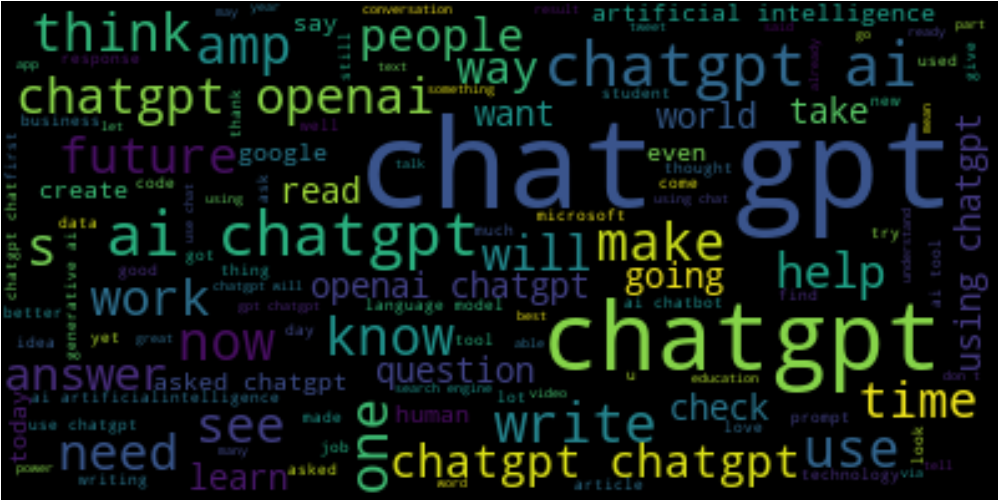

In [71]:
#wordcloud format
long_text = " ".join([i for i in (df_noduplicate_finalclean['Tweet'].values)])
w_cloud = WordCloud(background_color="black", max_words=1500,max_font_size = 50, contour_width=10, contour_color='steelblue')
w_cloud.generate(long_text)
plt.figure(figsize = (100,100))
plt.imshow(w_cloud, interpolation='bilinear')
plt.axis('off')

In [49]:
#pip install --upgrade pandas

In [74]:
print(df_noduplicate_finalclean.columns)

Index(['Date', 'Source', 'Location', 'Tweet', 'Likes', 'Retweet',
       'Tweet_lemmatized', 'Tokens'],
      dtype='object')


In [75]:
#Create Month Column in the dataframe
df_noduplicate_finalclean['Months'] = df_noduplicate_finalclean['Date'].dt.month_name()
df_noduplicate_finalclean['Month'] = df_noduplicate_finalclean['Months'].map({'June': "June,2023",'May': "May,2023",'April': "April,2023",'March': "March,2023",'February': "February,2023", 'January': "January,2023", 'December': "December,2022",'November': "November,2022"})
df_noduplicate_finalclean = df_noduplicate_finalclean.drop('Months', axis=1)

# Exploratory Data Analysis

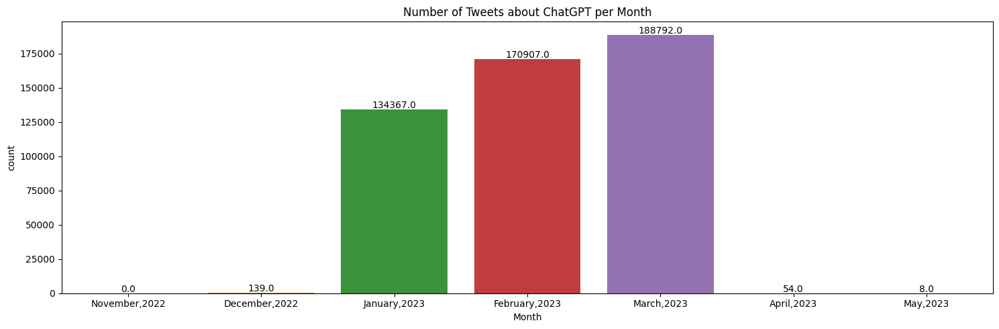

In [76]:
#identifying the volume of tweet on chatGPT in education based on date
#EDA on User Engagement daily, weekly and monthly 
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax = sns.countplot(x=df_noduplicate_finalclean['Month'], order = ['November,2022','December,2022', 'January,2023','February,2023','March,2023','April,2023', 'May,2023'])
for i in ax.patches:
    ax.text(i.get_width()/2 + i.get_x(), i.get_height()+1000, i.get_height(), horizontalalignment='center')
ax.set_title('Number of Tweets about ChatGPT per Month')
plt.tight_layout()
plt.show()

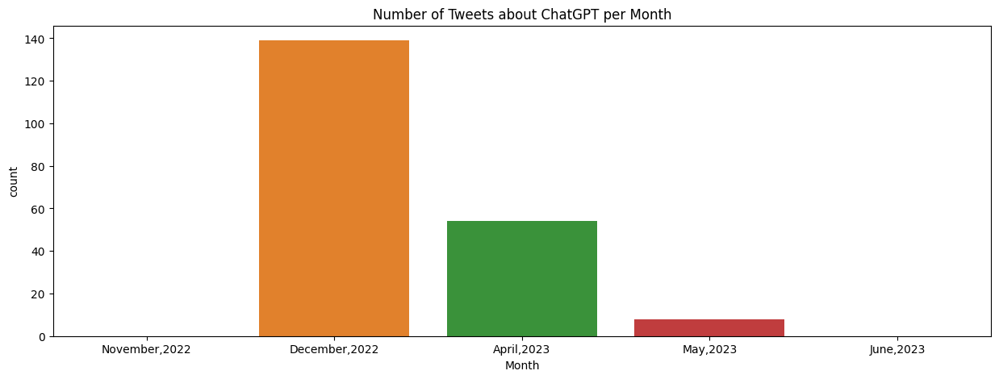

In [77]:
#identifying the volume of tweet on chatGPT in education based on date
#EDA on User Engagement daily, weekly and monthly 
fig, ax = plt.subplots(1,1, figsize=(15,5))
ax = sns.countplot(x=df_noduplicate_finalclean['Month'], order = ['November,2022','December,2022','April,2023', 'May,2023', 'June,2023'])
#for i in ax.patches:
   # ax.text(i.get_width()/2 + i.get_x(), i.get_height()+200, i.get_height(), horizontalalignment='center')
ax.set_title('Number of Tweets about ChatGPT per Month')
#plt.tight_layout()
plt.show()

In [78]:
#identifying the number of tweet on chatGPT in education based on date
df_noduplicate_finalclean['Date'].value_counts().sort_index()

2022-12-04    25
2022-12-05    88
2022-12-06     5
2022-12-08     2
2022-12-10     1
              ..
2023-05-15     1
2023-05-23     1
2023-05-24     1
2023-05-25     2
2023-05-29     1
Name: Date, Length: 125, dtype: int64

<AxesSubplot: ylabel='Month'>

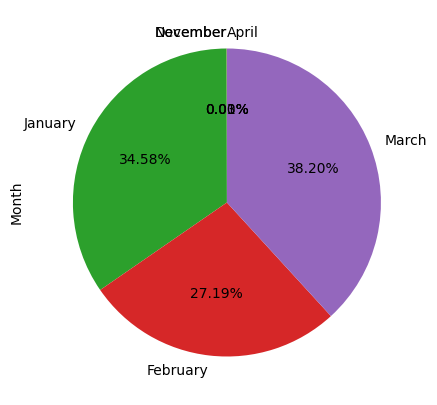

In [79]:
#pie chart for percentage distribution
df_noduplicate_finalclean['Month'].value_counts().sort_index().plot.pie(autopct ='%1.2f%%', labels=['November','December','January', 'February', 'March', 'April', 'May', 'June'], figsize=(10,5), startangle=90)

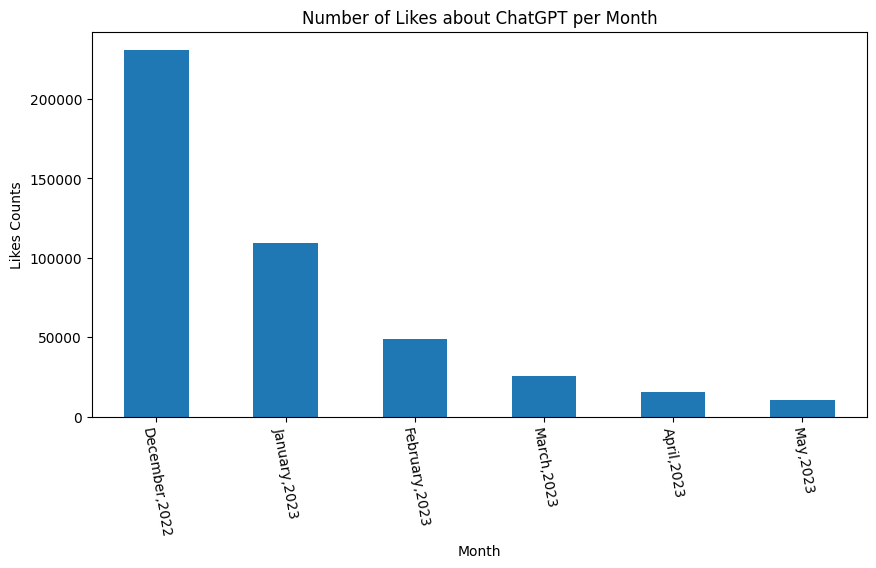

In [81]:
#identifying the number of tweet likes per month
likes_counts = df_noduplicate_finalclean['Likes'].value_counts()

# Plotting the number of tweet likes per month 
plt.figure(figsize=(10, 5))
likes_counts.plot(kind='bar')
sns.countplot(x=df_noduplicate_finalclean['Likes'],order = ['December,2022', 'January,2023', 'February,2023', 'March,2023', 'April,2023', 'May,2023'])
plt.xlabel('Month')  #x axis label
plt.ylabel('Likes Counts') #y axis label
plt.title('Number of Likes about ChatGPT per Month') # Title label
plt.xticks(rotation=1000)  # Rotating the x-axis labels to prevent overlapping of dates
plt.show() #display the bar chart

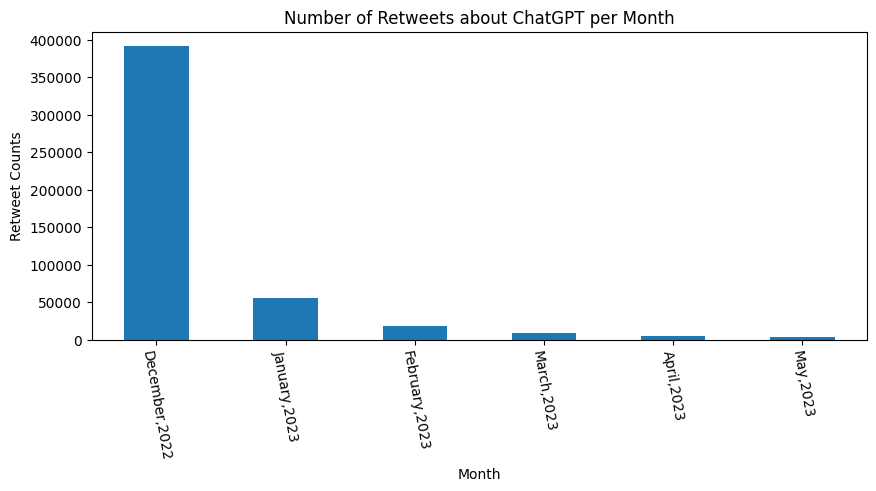

In [83]:
#identifying the number of tweet likes per month
retweet_counts = df_noduplicate_finalclean['Retweet'].value_counts()

# Plotting the number of retweets per month
plt.figure(figsize=(10, 4))
retweet_counts.plot(kind='bar')
sns.countplot(x=df_noduplicate_finalclean['Retweet'], order = ['December,2022', 'January,2023', 'February,2023', 'March,2023', 'April,2023', 'May,2023'])
plt.xlabel('Month')  #x axis label
plt.ylabel('Retweet Counts') #y axis label
plt.title('Number of Retweets about ChatGPT per Month') # Title label
plt.xticks(rotation=1000)  # Rotating the x-axis labels to prevent overlapping of dates
plt.show() #display the bar chart

In [151]:
#pip install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu117

In [152]:
#pip install transformers

In [74]:
#save the file as a csv file
df_SA = pd.read_csv('ChatGPT_CleanTweetsFinal.csv')

In [12]:
df_SA.tail(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens
494262,04/01/2023,Unknown,Unknown,#lamda versus #chatgpt ?! who cares? lamda isn...,1,0,"['lamda', 'versus', 'chatgpt', 'care', 'lamda'...",lamda versus chatgpt care lamda isnt available...
494263,04/01/2023,Unknown,Unknown,#chatgpt so much #censorship. never trust a sy...,2,0,"['chatgpt', 'much', 'censorship', 'never', 'tr...",chatgpt much censorship never trust system don...
494264,04/01/2023,Unknown,Unknown,all my twitter feed is about chatgpt and lol 😆...,3,1,"['twitter', 'feed', 'chatgpt', 'lol', 'ai', 'c...",twitter feed chatgpt lol ai chatgpt
494265,04/01/2023,Unknown,Unknown,i'm quite amazed by chat gpt. a really promisi...,1,0,"['im', 'quite', 'amazed', 'chat', 'gpt', 'real...",im quite amazed chat gpt really promise person...
494266,04/01/2023,Unknown,Unknown,i used chat gpt to get gym workout program and...,0,0,"['use', 'chat', 'gpt', 'get', 'gym', 'workout'...",use chat gpt get gym workout program good sore...


In [153]:
#!pip install pyLDAvis
#!pip install mallet
#!pip install gensim

In [154]:
# pip install --upgrade pip

In [155]:
#pip install pyLDAvis

In [156]:
#pip install mallet

# Bigram and Trigram Model

In [77]:
#import libraries
import matplotlib.pyplot as plt
import pyLDAvis
import pyLDAvis.gensim
import mallet

In [78]:
#import libraries
import gensim
from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim.models.ldamulticore import LdaMulticore
from gensim.models.coherencemodel import CoherenceModel
from gensim.utils import simple_preprocess
from gensim.models.phrases import Phrases, Phraser
from pprint import pprint

In [79]:
df_SA.shape

(494267, 8)

In [80]:
df_SA.head(2)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens
0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...",subscribe poe pay tierget ready upgrade quora ...
1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...",elonmusk fume openai become â30b market profit...


In [81]:
#remove stopwords
stopwords = nltk.corpus.stopwords.words('english')
len(stopwords)
#simple_preprocesst 
df_SA['Token'] = df_SA['Tweet_lemmatized'].apply(lambda x: [word for word in simple_preprocess(x) if word not in stopwords])

In [82]:
df_SA.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens,Token
0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...",subscribe poe pay tierget ready upgrade quora ...,"[subscribe, poe, pay, tierget, ready, upgrade,..."
1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...",elonmusk fume openai become â30b market profit...,"[elonmusk, fume, openai, become, market, profi..."
2,16/03/2023,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"['chatgpt4', 'world', 'never', 'current', 'ver...",chatgpt4 world never current version chatgpt b...,"[chatgpt, world, never, current, version, chat..."
3,16/03/2023,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"['look', 'inside', 'autoblog', 'gpt', 'review'...",look inside autoblog gpt review aidriven blogg...,"[look, inside, autoblog, gpt, review, aidriven..."
4,16/03/2023,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"['say', 'goodbye', 'writer', 'block', 'autoblo...",say goodbye writer block autoblog gpt indepth ...,"[say, goodbye, writer, block, autoblog, gpt, i..."


In [83]:
#bigram and trigrams development
bigram = Phrases(df_SA['Token'], min_count=10, threshold=100)

#bigram[df_SA['Token']] will apply the bigram object to each row of the df['Token'] column
df_SA['Bigram'] = bigram[df_SA['Token']]
bigram_mod = gensim.models.phrases.Phraser(bigram)

In [84]:
df_SA['Bigram'].head(5)

0    [subscribe, poe, pay, tierget, ready, upgrade,...
1    [elonmusk, fume, openai, become, market, profi...
2    [chatgpt, world, never, current, version, chat...
3    [look, inside, autoblog, gpt, review, aidriven...
4    [say, goodbye, writer, block, autoblog, gpt, i...
Name: Bigram, dtype: object

In [85]:
#trigrams development
trigram = Phrases(df_SA['Bigram'], min_count=10, threshold=100)
df_SA['Trigram'] = trigram[df_SA['Bigram']]
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [86]:
df_SA.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens,Token,Bigram,Trigram
0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...",subscribe poe pay tierget ready upgrade quora ...,"[subscribe, poe, pay, tierget, ready, upgrade,...","[subscribe, poe, pay, tierget, ready, upgrade,...","[subscribe, poe, pay, tierget, ready, upgrade,..."
1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...",elonmusk fume openai become â30b market profit...,"[elonmusk, fume, openai, become, market, profi...","[elonmusk, fume, openai, become, market, profi...","[elonmusk, fume, openai, become, market, profi..."
2,16/03/2023,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"['chatgpt4', 'world', 'never', 'current', 'ver...",chatgpt4 world never current version chatgpt b...,"[chatgpt, world, never, current, version, chat...","[chatgpt, world, never, current, version, chat...","[chatgpt, world, never, current, version, chat..."
3,16/03/2023,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"['look', 'inside', 'autoblog', 'gpt', 'review'...",look inside autoblog gpt review aidriven blogg...,"[look, inside, autoblog, gpt, review, aidriven...","[look, inside, autoblog, gpt, review, aidriven...","[look, inside, autoblog, gpt, review, aidriven..."
4,16/03/2023,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"['say', 'goodbye', 'writer', 'block', 'autoblo...",say goodbye writer block autoblog gpt indepth ...,"[say, goodbye, writer, block, autoblog, gpt, i...","[say, goodbye, writer, block, autoblog, gpt, i...","[say, goodbye, writer, block, autoblog, gpt, i..."


In [87]:
# The bigram and trigram phrases 
bi_phrase = bigram.export_phrases()
tri_phrase = trigram.export_phrases()
print(f'Bi:{len(bi_phrase)}, Tri:{len(tri_phrase)}')

Bi:4090, Tri:4536


In [99]:
#bi_phrase, tri_phrase

In [26]:
#df_SA['bi_phrase'] = df_SA['Trigram'].apply(lambda x: ' '.join(x))
#df_SA['tri_phrase'] = df_SA['bi_phrase'].apply(lambda x: ' '.join(x))

In [89]:
df_SA.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens,Token,Bigram,Trigram
0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...",subscribe poe pay tierget ready upgrade quora ...,"[subscribe, poe, pay, tierget, ready, upgrade,...","[subscribe, poe, pay, tierget, ready, upgrade,...","[subscribe, poe, pay, tierget, ready, upgrade,..."
1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...",elonmusk fume openai become â30b market profit...,"[elonmusk, fume, openai, become, market, profi...","[elonmusk, fume, openai, become, market, profi...","[elonmusk, fume, openai, become, market, profi..."
2,16/03/2023,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"['chatgpt4', 'world', 'never', 'current', 'ver...",chatgpt4 world never current version chatgpt b...,"[chatgpt, world, never, current, version, chat...","[chatgpt, world, never, current, version, chat...","[chatgpt, world, never, current, version, chat..."
3,16/03/2023,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"['look', 'inside', 'autoblog', 'gpt', 'review'...",look inside autoblog gpt review aidriven blogg...,"[look, inside, autoblog, gpt, review, aidriven...","[look, inside, autoblog, gpt, review, aidriven...","[look, inside, autoblog, gpt, review, aidriven..."
4,16/03/2023,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"['say', 'goodbye', 'writer', 'block', 'autoblo...",say goodbye writer block autoblog gpt indepth ...,"[say, goodbye, writer, block, autoblog, gpt, i...","[say, goodbye, writer, block, autoblog, gpt, i...","[say, goodbye, writer, block, autoblog, gpt, i..."


# Topic Modelling from ChatGPT Tweets

In [90]:
#import library
import gensim
from gensim.utils import simple_preprocess
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/adebimpeolorundare/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [91]:
#identify keywords
def sent_words(sentences):
    for sentence in sentences:
        # deacc=True removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) 
             if word not in stop_words] for doc in texts]
data = df_SA.Trigram.values.tolist()
data_words = list(sent_words(data))
# remove stop words
data_words = remove_stopwords(data_words)
print(data_words[:1][0][:200])

['subscribe', 'poe', 'pay', 'tierget', 'ready', 'upgrade', 'quora', 'game', 'poes', 'new', 'pay', 'tier', 'per', 'month', 'per', 'year', 'ask', 'question', 'bot', 'power', 'advanced', 'model', 'like', 'gpt', 'claude', 'version', 'chatgpt', 'gpt', 'ai', 'chatgptai']


# Dictionary and Corpus for Topic Modeling

In [92]:
#import library
import gensim.corpora as corpora
# Create Dictionary
id2word = corpora.Dictionary(data_words)
# Create Corpus
texts = data_words
# determine Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# Print the output
print(corpus[:1][0][:200])


[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 2), (9, 1), (10, 1), (11, 1), (12, 1), (13, 2), (14, 2), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1)]


In [95]:
#import library
from pprint import pprint
# assign number of topics 
num_topics = 10
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Print the keywords 
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.131*"chatgpt" + 0.111*"ai" + 0.029*"openai" + 0.013*"midjourney" + '
  '0.012*"machinelearning" + 0.011*"gpt" + 0.011*"technology" + 0.010*"dalle" '
  '+ 0.009*"tech" + 0.009*"art"'),
 (1,
  '0.081*"chatgpt" + 0.032*"use" + 0.030*"write" + 0.014*"generate" + '
  '0.014*"create" + 0.013*"ai" + 0.012*"prompt" + 0.011*"content" + '
  '0.010*"make" + 0.010*"code"'),
 (2,
  '0.093*"chatgpt" + 0.021*"year" + 0.013*"month" + 0.013*"use" + 0.010*"day" '
  '+ 0.010*"time" + 0.009*"source" + 0.007*"capacity" + 0.007*"make" + '
  '0.006*"last"'),
 (3,
  '0.085*"chatgpt" + 0.056*"ai" + 0.018*"use" + 0.014*"tool" + 0.011*"amp" + '
  '0.011*"technology" + 0.010*"business" + 0.009*"learn" + 0.009*"student" + '
  '0.009*"education"'),
 (4,
  '0.070*"chatgpt" + 0.020*"human" + 0.016*"ai" + 0.013*"like" + 0.010*"say" + '
  '0.009*"people" + 0.007*"think" + 0.006*"make" + 0.006*"world" + 0.006*"go"'),
 (5,
  '0.092*"chatgpt" + 0.032*"answer" + 0.029*"question" + 0.022*"ask" + '
  '0.014*"get" +

In [96]:
#create html file for topic modelling output
pyLDAvis.enable_notebook()
corpus_dict = Dictionary.from_corpus(corpus, id2word=lda_model.id2word)
vis = pyLDAvis.gensim.prepare(lda_model, corpus, dictionary=corpus_dict )
pyLDAvis.save_html(vis, 'lda_pos.html')

# Visualisation of the topics-keywords

In [97]:
# Visualisation of the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.077363 -0.141996       1        1  16.798436
1      0.057925 -0.011712       2        1  14.615594
8      0.233630  0.085879       3        1  13.242838
0     -0.176592 -0.093731       4        1   9.252745
9      0.118685 -0.050872       5        1   9.190028
5      0.093249  0.015064       6        1   8.866407
7     -0.202384  0.026005       7        1   8.653692
6     -0.195334  0.169972       8        1   7.332910
4      0.093316 -0.101475       9        1   7.038138
2      0.054867  0.102866      10        1   5.009213, topic_info=        Term           Freq          Total Category  logprob  loglift
76      chat  131939.000000  131939.000000  Default  30.0000  30.0000
8        gpt  164997.000000  164997.000000  Default  29.0000  29.0000
4    chatgpt  513839.000000  513839.000000  Default  28.0000  28.0000
1         ai  199314.000000  199314.000000  Default  27.0000  27.0000
31    openai   62334.000000   62334.000000  Default  26.0000  26.0000
..       ...            ...            ...      ...      ...      ...
2        ask    1601.744447   38178.203732  Topic10  -5.3173  -0.1773
241     work    1435.721562   22356.463853  Topic10  -5.4267   0.2484
369     take    1394.261601   20301.479702  Topic10  -5.4560   0.3156
1         ai    1851.924916  199314.231752  Topic10  -5.1721  -1.6848
66      well    1239.936387   15460.048245  Topic10  -5.5733   0.4707

[903 rows x 6 columns], token_table=      Topic      Freq             Term
term                                  
5644      7  0.001550  academictwitter
5644      8  0.996379  academictwitter
499       1  0.039906           access
499       2  0.049626           access
499       3  0.032743           access
...     ...       ...              ...
242       6  0.013536          youtube
242       7  0.153621          youtube
242       8  0.001574          youtube
242       9  0.002518          youtube
242      10  0.009129          youtube

[3567 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 2, 9, 1, 10, 6, 8, 7, 5, 3])

# VADER Sentiment Analysis

In [29]:
#Download the VADER lexicon for sentiment analysis
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/adebimpeolorundare/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [27]:
#import library
from nltk.sentiment.vader import SentimentIntensityAnalyzer
# read the tweets dataset 
tweets_df = df_SA 


In [28]:
# data preprocess data
# remove mention'
tweets_df["VADER_content"] = tweets_df['Tweet'].replace(r"@[A-Za-z0-9_]+", "", regex=True)
# remove URLs
tweets_df["VADER_content"] = tweets_df["VADER_content"].replace(r"http\S+|www\.\S+", "", regex=True)
# remove hashtag symbols
tweets_df["VADER_content"] = tweets_df["VADER_content"].replace(r"#", "", regex=True)

In [29]:
tweets_df.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens,VADER_content
0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...",subscribe poe pay tierget ready upgrade quora ...,will you be subscribing to poe's paid tier?get...
1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...",elonmusk fume openai become â30b market profit...,elonmusk fumes over openai becoming â$30b ma...
2,16/03/2023,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"['chatgpt4', 'world', 'never', 'current', 'ver...",chatgpt4 world never current version chatgpt b...,with chatgpt4 the world will never be the same...
3,16/03/2023,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"['look', 'inside', 'autoblog', 'gpt', 'review'...",look inside autoblog gpt review aidriven blogg...,a look inside autoblog gpt: reviewing the ai-d...
4,16/03/2023,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"['say', 'goodbye', 'writer', 'block', 'autoblo...",say goodbye writer block autoblog gpt indepth ...,say goodbye to writer's block with autoblog gp...


In [30]:
%%time #indictae the process time
# The VADER sentiment analyzer
vader_model = SentimentIntensityAnalyzer()
# assign VADER model to the tweet dataset
tweets_df["VADER_scores"] = tweets_df["VADER_content"].apply(
    lambda text: vader_model.polarity_scores(text)
)

CPU times: user 3min 57s, sys: 5.85 s, total: 4min 3s
Wall time: 4min 48s


In [31]:
tweets_df.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens,VADER_content,VADER_scores
0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...",subscribe poe pay tierget ready upgrade quora ...,will you be subscribing to poe's paid tier?get...,"{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'comp..."
1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...",elonmusk fume openai become â30b market profit...,elonmusk fumes over openai becoming â$30b ma...,"{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'comp..."
2,16/03/2023,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"['chatgpt4', 'world', 'never', 'current', 'ver...",chatgpt4 world never current version chatgpt b...,with chatgpt4 the world will never be the same...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
3,16/03/2023,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"['look', 'inside', 'autoblog', 'gpt', 'review'...",look inside autoblog gpt review aidriven blogg...,a look inside autoblog gpt: reviewing the ai-d...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
4,16/03/2023,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"['say', 'goodbye', 'writer', 'block', 'autoblo...",say goodbye writer block autoblog gpt indepth ...,say goodbye to writer's block with autoblog gp...,"{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'comp..."


In [81]:
# VADER polarity score
tweets_df["VADER_polarity"] = tweets_df["VADER_scores"].apply(
    lambda score_dict: score_dict["compound"]
)
#assign polarity bin
tweets_df["VADER_sentiment"] = pd.cut(
   tweets_df["VADER_polarity"],
    bins=[-1.0, -0.25, 0.25, 1.0],
    labels=["Negative", "Neutral", "Positive"],
)

In [33]:
tweets_df['VADER_sentiment'].head(50000)

0        Positive
1         Neutral
2         Neutral
3         Neutral
4        Negative
           ...   
49995    Negative
49996    Positive
49997    Negative
49998    Negative
49999     Neutral
Name: VADER_sentiment, Length: 50000, dtype: category
Categories (3, object): ['Negative' < 'Neutral' < 'Positive']

In [82]:
tweets_df[[ "VADER_content", "VADER_polarity", "VADER_sentiment"]].head(5)

,VADER_content,VADER_polarity,VADER_sentiment
0,will you be subscribing to poe's paid tier?get...,0.7424,Positive
1,elonmusk fumes over openai becoming â$30b ma...,-0.0258,Neutral
2,with chatgpt4 the world will never be the same...,0.0000,Neutral
3,a look inside autoblog gpt: reviewing the ai-d...,0.0000,Neutral
4,say goodbye to writer's block with autoblog gp...,-0.4404,Negative


In [83]:
tweets_df.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens,VADER_content,VADER_scores,VADER_polarity,VADER_sentiment,VADER_Polarity
0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...",subscribe poe pay tierget ready upgrade quora ...,will you be subscribing to poe's paid tier?get...,"{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'comp...",0.7424,Positive,P o s i t i v e
1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...",elonmusk fume openai become â30b market profit...,elonmusk fumes over openai becoming â$30b ma...,"{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'comp...",-0.0258,Neutral,N e u t r a l
2,16/03/2023,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"['chatgpt4', 'world', 'never', 'current', 'ver...",chatgpt4 world never current version chatgpt b...,with chatgpt4 the world will never be the same...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neutral,N e u t r a l
3,16/03/2023,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"['look', 'inside', 'autoblog', 'gpt', 'review'...",look inside autoblog gpt review aidriven blogg...,a look inside autoblog gpt: reviewing the ai-d...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neutral,N e u t r a l
4,16/03/2023,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"['say', 'goodbye', 'writer', 'block', 'autoblo...",say goodbye writer block autoblog gpt indepth ...,say goodbye to writer's block with autoblog gp...,"{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'comp...",-0.4404,Negative,N e g a t i v e


Text(0.5, 1.0, 'Distribution of VADER polarity')

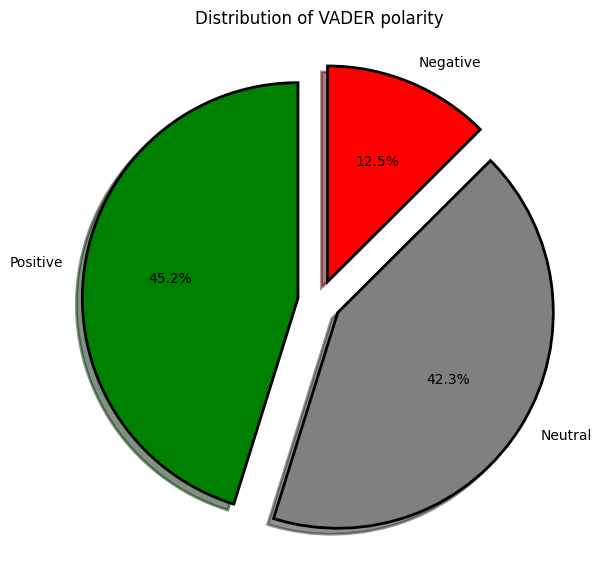

In [41]:
#pie chart to show percentage distribution of polarity
#pie chart visualisation format
fig = plt.figure(figsize=(7,7))
colors = ('green', 'grey', 'red')
wp={'linewidth':2, 'edgecolor': 'black'}
tags=tweets_df['VADER_sentiment'].value_counts()
explode = (0.1,0.1,0.1)
tags.plot(kind='pie', autopct='%1.1f%%', shadow=True, colors=colors, 
         startangle=90, wedgeprops=wp,explode=explode, label='')
plt.title('Distribution of VADER polarity')

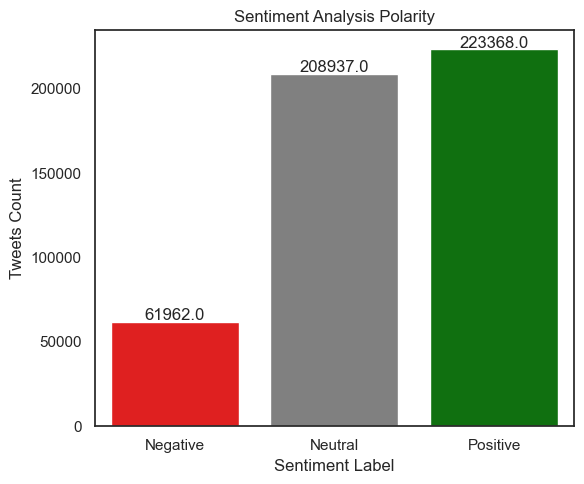

In [48]:
#Tweets sentiment polarity result 
tweets_sentiment_counts =  tweets_df['VADER_sentiment'].value_counts()

sns.set(style="white")

# barplot to represent tweets sentiment polarity
fig, ax = plt.subplots(figsize=(6, 5))
sns.barplot(x=tweets_sentiment_counts.index, y=tweets_sentiment_counts.values, ax=ax, palette = ['red','grey','green'])

# plot title and axis labels
ax.set_title('Sentiment Analysis Polarity')
ax.set_ylabel('Tweets Count')
ax.set_xlabel('Sentiment Label')

# Rotate x-axis labels upright
plt.xticks(rotation='horizontal')

# Add tweets data on each column
for i in ax.patches:
    ax.text(i.get_width()/2 + i.get_x(), i.get_height()+1000, i.get_height(), horizontalalignment='center')

# visualisation chart
plt.tight_layout()
plt.show()

In [599]:
#save the file as csv
tweets_df.to_csv('tweets_df.csv', index=False)

In [239]:
#pip install gensim nltk

In [49]:
#import libraries
import gensim
from gensim import corpora
from gensim.models import LdaModel
from nltk.tokenize import RegexpTokenizer

# RoBERTa (Robustly Optimized BERT Pre-training) Model Sentiment Analysis Implementation

In [50]:
#import libraries
import pandas as pd
import torch
import torch.nn as nn
from transformers import AutoModelForSequenceClassification
from transformers import AutoTokenizer, AutoConfig
from scipy.special import softmax

In [51]:
#load the model and tokenizer

model_path = "cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer = AutoTokenizer.from_pretrained(model_path)
config = AutoConfig.from_pretrained(model_path)
roberta_model = AutoModelForSequenceClassification.from_pretrained(model_path)

/opt/anaconda3/lib/python3.9/site-packages/transformers/modeling_utils.py:3319: DeprecationWarning: The 'warn' method is deprecated, use 'warning' instead
  warner(
Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [3]:
#read the csv file
df_RoBERTa_Model = pd.read_csv('tweets_df.csv')

In [8]:
df_RoBERTa_Model= tweets_df

In [610]:
df_RoBERTa_Model.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens,Token,Bigram,Trigram,bi_phrase,tri_phrase,sentiment,roberta_content,VADER_sentiment,VADER_content,VADER_scores,VADER_polarity
0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...","[list, of, tokenized, tweets]","[subscribe, poe, pay, tierget, ready, upgrade,...","[subscribe, poe, pay, tierget, ready, upgrade,...","[subscribe, poe, pay, tierget, ready, upgrade,...",subscribe poe pay tierget ready upgrade quora ...,s u b s c r i b e p o e p a y t i e r g ...,neutral,will you be subscribing to poe's paid tier?get...,Positive,will you be subscribing to poe's paid tier?get...,"{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'comp...",0.7424
1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...","[list, of, tokenized, tweets]","[elonmusk, fume, openai, become, market, profi...","[elonmusk, fume, openai, become, market, profi...","[elonmusk, fume, openai, become, market, profi...",elonmusk fume openai become market profitð cha...,e l o n m u s k f u m e o p e n a i b e ...,neutral,#elonmusk fumes over #openai becoming â$30b ...,Neutral,elonmusk fumes over openai becoming â$30b ma...,"{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'comp...",-0.0258
2,16/03/2023,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"['chatgpt4', 'world', 'never', 'current', 'ver...","[list, of, tokenized, tweets]","[chatgpt, world, never, current, version, chat...","[chatgpt, world, never, current, version, chat...","[chatgpt, world, never, current, version, chat...",chatgpt world never current version chatgpt bu...,c h a t g p t w o r l d n e v e r c u r ...,neutral,with chatgpt4 the world will never be the same...,Neutral,with chatgpt4 the world will never be the same...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000
3,16/03/2023,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"['look', 'inside', 'autoblog', 'gpt', 'review'...","[list, of, tokenized, tweets]","[look, inside, autoblog, gpt, review, aidriven...","[look, inside, autoblog, gpt, review, aidriven...","[look, inside, autoblog, gpt, review, aidriven...",look inside autoblog gpt review aidriven blogg...,l o o k i n s i d e a u t o b l o g g p ...,neutral,a look inside autoblog gpt: reviewing the ai-d...,Neutral,a look inside autoblog gpt: reviewing the ai-d...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000
4,16/03/2023,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"['say', 'goodbye', 'writer', 'block', 'autoblo...","[list, of, tokenized, tweets]","[say, goodbye, writer, block, autoblog, gpt, i...","[say, goodbye, writer, block, autoblog, gpt, i...","[say, goodbye, writer, block, autoblog, gpt, i...",say goodbye writer block autoblog gpt indepth ...,s a y g o o d b y e w r i t e r b l o c ...,neutral,say goodbye to writer's block with autoblog gp...,Negative,say goodbye to writer's block with autoblog gp...,"{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'comp...",-0.4404


In [604]:
df_RoBERTa_Model['Tweet'] =df_RoBERTa_Model['Tweet'].replace(r"\n", " ", regex=True)

In [619]:
# RoBERTa Model preprocessing
def RoBERTa_preprocess(text):
    new_text = []
    for t in text.split(" "):
        t = "@user" if t.startswith("@") and len(t) > 1 else t
        t = "http" if t.startswith("http") else t
        new_text.append(t)
    return " ".join(new_text)

In [620]:
# assign preprocessing functions to the content
df_RoBERTa_Model["RoBERTa_content"] = df_RoBERTa_Model["Tweet"].apply(RoBERTa_preprocess)

In [84]:
df_RoBERTa_Model.head(5)

,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens,VADER_content,VADER_scores,VADER_polarity,VADER_sentiment,VADER_Polarity
0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...",subscribe poe pay tierget ready upgrade quora ...,will you be subscribing to poe's paid tier?get...,"{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'comp...",0.7424,Positive,P o s i t i v e
1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...",elonmusk fume openai become â30b market profit...,elonmusk fumes over openai becoming â$30b ma...,"{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'comp...",-0.0258,Neutral,N e u t r a l
2,16/03/2023,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"['chatgpt4', 'world', 'never', 'current', 'ver...",chatgpt4 world never current version chatgpt b...,with chatgpt4 the world will never be the same...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neutral,N e u t r a l
3,16/03/2023,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"['look', 'inside', 'autoblog', 'gpt', 'review'...",look inside autoblog gpt review aidriven blogg...,a look inside autoblog gpt: reviewing the ai-d...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neutral,N e u t r a l
4,16/03/2023,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"['say', 'goodbye', 'writer', 'block', 'autoblo...",say goodbye writer block autoblog gpt indepth ...,say goodbye to writer's block with autoblog gp...,"{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'comp...",-0.4404,Negative,N e g a t i v e


In [516]:
# define a function for text and model to calculate the probability of each sentiment
def sentiment_analyzer(Tweet,model):
    #return the output of PyTorch tensors
    encoded_tweet = tokenizer(Tweet, return_tensors='pt')   
    
    #calculate the sentimentin the tweets dataset
    output = model(**encoded_tweet)           
    
    #return the numPy array containing the embeddings of scores
    scores = output[0][0].detach().numpy()
    #normalize the scores to probability
    probability = np.round(softmax(scores),3)

    #calculate the polarity weight
    polarity_weights = torch.tensor([-0.05, 0, 0.05])
    
    #compute the tensor of probability
    probability = torch.tensor(probability)
    
    #compute the polartiy score
    polarity = polarity_weights*probability
    
    # sum the weighted probabilities along the last dimension
    polarity = polarity.sum(dim=-1)
    
    #Scale polarity score to range
    polarity_scaled = torch.nn.Tanh()(polarity)
    
    return round(polarity_scaled.item(),4)   

In [517]:
df_RoBERTa=tweets_df[0:494266].copy()

In [519]:
df_RoBERTa['Polarity']=df_RoBERTa['sentiment'].apply(lambda x: sentiment_analyzer(x,roberta_model))

In [11]:
df_RoBERTa = pd.read_csv('RoBERTa_final.csv')

In [12]:
df_RoBERTa['Polarity'].head(1000)

0      0.0352
1      0.0087
2      0.0087
3      0.0087
4     -0.0133
        ...  
995    0.0087
996   -0.0133
997    0.0352
998    0.0352
999    0.0352
Name: Polarity, Length: 1000, dtype: float64

In [18]:
#sort the bins
bins = sorted(bins)

In [16]:
#assign the sentiment labels and the bins
labels = ['Negative', 'Negative','Neutral' ,'Positive']
bins = sorted([-0.01, -0.05 , 0.01, 0.05])

# Cut the 'Polarity' column into bins and assign labels
df_RoBERTa['RoBERTa_Sentiment'] = pd.cut(df_RoBERTa['Polarity'], bins=bins, labels=labels[1:], right=False)

In [17]:
df_RoBERTa['RoBERTa_Sentiment'].head(5)

0    Positive
1     Neutral
2     Neutral
3     Neutral
4    Negative
Name: RoBERTa_Sentiment, dtype: category
Categories (3, object): ['Negative' < 'Neutral' < 'Positive']

In [466]:
df_RoBERTa.to_csv(f'..//RoBERTa_Newest.csv')

In [526]:
df_RoBERTa.head(10)

,Unnamed: 0,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens,Token,Bigram,Trigram,bi_phrase,tri_phrase,sentiment,Polarity,RoBERTa_Sentiment
0,0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...","['list', 'of', 'tokenized', 'tweets']","['subscribe', 'poe', 'pay', 'tierget', 'ready'...","['subscribe', 'poe', 'pay', 'tierget', 'ready'...","['subscribe', 'poe', 'pay', 'tierget', 'ready'...",subscribe poe pay tierget ready upgrade quora ...,s u b s c r i b e p o e p a y t i e r g ...,positive,0.0352,Positive
1,1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...","['list', 'of', 'tokenized', 'tweets']","['elonmusk', 'fume', 'openai', 'become', 'mark...","['elonmusk', 'fume', 'openai', 'become', 'mark...","['elonmusk', 'fume', 'openai', 'become', 'mark...",elonmusk fume openai become market profitð cha...,e l o n m u s k f u m e o p e n a i b e ...,neutral,0.0087,Neutral
2,2,16/03/2023,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"['chatgpt4', 'world', 'never', 'current', 'ver...","['list', 'of', 'tokenized', 'tweets']","['chatgpt', 'world', 'never', 'current', 'vers...","['chatgpt', 'world', 'never', 'current', 'vers...","['chatgpt', 'world', 'never', 'current', 'vers...",chatgpt world never current version chatgpt bu...,c h a t g p t w o r l d n e v e r c u r ...,neutral,0.0087,Neutral
3,3,16/03/2023,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"['look', 'inside', 'autoblog', 'gpt', 'review'...","['list', 'of', 'tokenized', 'tweets']","['look', 'inside', 'autoblog', 'gpt', 'review'...","['look', 'inside', 'autoblog', 'gpt', 'review'...","['look', 'inside', 'autoblog', 'gpt', 'review'...",look inside autoblog gpt review aidriven blogg...,l o o k i n s i d e a u t o b l o g g p ...,neutral,0.0087,Neutral
4,4,16/03/2023,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"['say', 'goodbye', 'writer', 'block', 'autoblo...","['list', 'of', 'tokenized', 'tweets']","['say', 'goodbye', 'writer', 'block', 'autoblo...","['say', 'goodbye', 'writer', 'block', 'autoblo...","['say', 'goodbye', 'writer', 'block', 'autoblo...",say goodbye writer block autoblog gpt indepth ...,s a y g o o d b y e w r i t e r b l o c ...,negative,-0.0133,Negative
5,5,16/03/2023,Twitter Web App,Bangladesh,transform your blog with ai: a review of autob...,0,0,"['transform', 'blog', 'ai', 'review', 'autoblo...","['list', 'of', 'tokenized', 'tweets']","['transform', 'blog', 'ai', 'review', 'autoblo...","['transform', 'blog', 'ai', 'review', 'autoblo...","['transform', 'blog', 'ai', 'review', 'autoblo...",transform blog ai review autoblog gpt chatgpt ...,t r a n s f o r m b l o g a i r e v i e ...,neutral,0.0087,Neutral
6,6,16/03/2023,Twitter Web App,Bangladesh,autoblog gpt vs. traditional blogging: which i...,0,0,"['autoblog', 'gpt', 'vs', 'traditional', 'blog...","['list', 'of', 'tokenized', 'tweets']","['autoblog', 'gpt', 'vs', 'traditional', 'blog...","['autoblog', 'gpt', 'vs', 'traditional', 'blog...","['autoblog', 'gpt', 'vs', 'traditional', 'blog...",autoblog gpt vs traditional blogging well busi...,a u t o b l o g g p t v s t r a d i t i ...,positive,0.0352,Positive
7,7,16/03/2023,Twitter Web App,Bangladesh,autoblog gpt: the key to unlocking efficiency ...,0,0,"['autoblog', 'gpt', 'key', 'unlocking', 'effic...","['list', 'of', 'tokenized', 'tweets']","['autoblog', 'gpt', 'key', 'unlocking', 'effic...","['autoblog', 'gpt', 'key_unlocking', 'efficien...","['autoblog', 'gpt', 'key_unlocking', 'efficien...",autoblog gpt key_unlocking efficiency producti...,a u t o b l o g g p t k e y _ u n l o c k ...,positive,0.0352,Positive
8,8,16/03/2023,Twitter Web App,Bangladesh,the benefits of autoblog gpt: a review of the ...,0,0,"['benefit', 'autoblog', 'gpt', 'review',

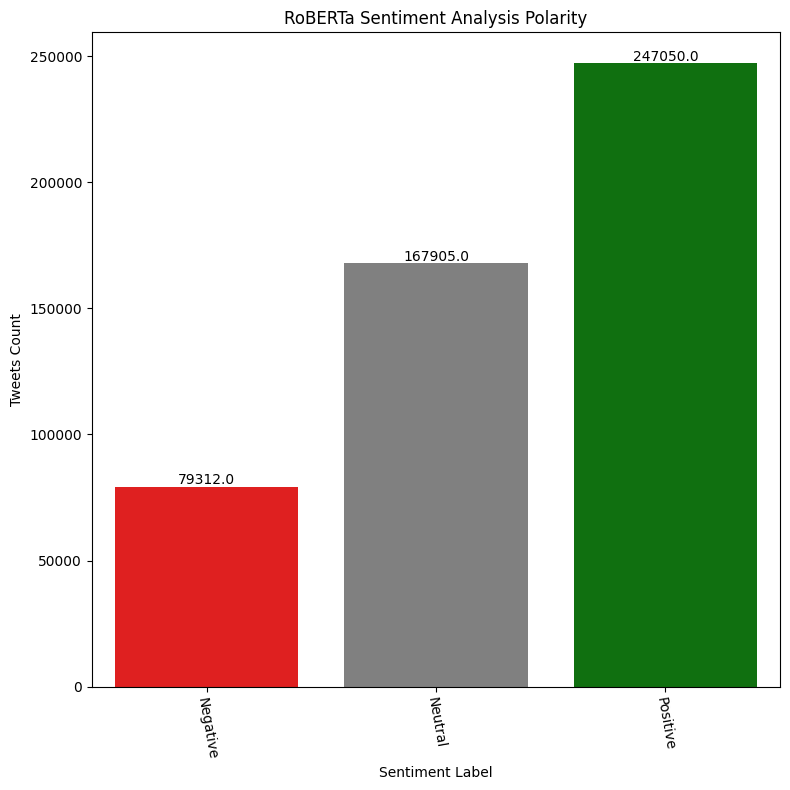

In [19]:
#Tweets sentiment polarity result visualisation
RoBERTa_sentiment_counts = df_RoBERTa['RoBERTa_Sentiment'].value_counts()

# barplot to reoresent tweets sentiment polarity
fig, ax = plt.subplots(figsize=(8,8))
sns.barplot(x=RoBERTa_sentiment_counts.index,y=RoBERTa_sentiment_counts.values, ax=ax, palette = ['red','grey','green'])

# plot title and axis labels
ax.set_title('RoBERTa Sentiment Analysis Polarity')
ax.set_ylabel('Tweets Count')
ax.set_xlabel('Sentiment Label')
plt.xticks(rotation=1000)

# Add tweets data on each column
for i in ax.patches:
    ax.text(i.get_width()/2 + i.get_x(), i.get_height()+1000, i.get_height(), horizontalalignment='center')

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Distribution of RoBERTa polarity')

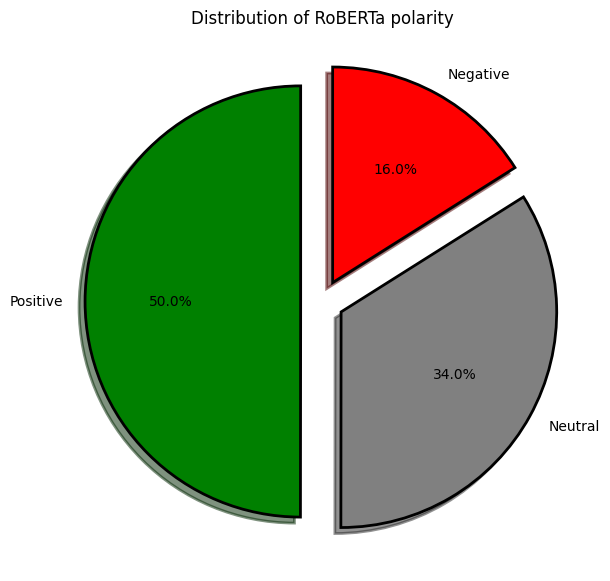

In [40]:
#pie chart to show percentage distribution of polarity
#pie chart visualisation format
fig = plt.figure(figsize=(7,7))
colors = ('green', 'grey', 'red')
wp={'linewidth':2, 'edgecolor': 'black'}
tags=df_RoBERTa['RoBERTa_Sentiment'].value_counts()
explode = (0.1,0.1,0.1)
tags.plot(kind='pie', autopct='%1.1f%%', shadow=True, colors=colors, 
         startangle=90, wedgeprops=wp, explode=explode, label='')
plt.title('Distribution of RoBERTa polarity')

# Sentiment Polarity Performance Visualisation

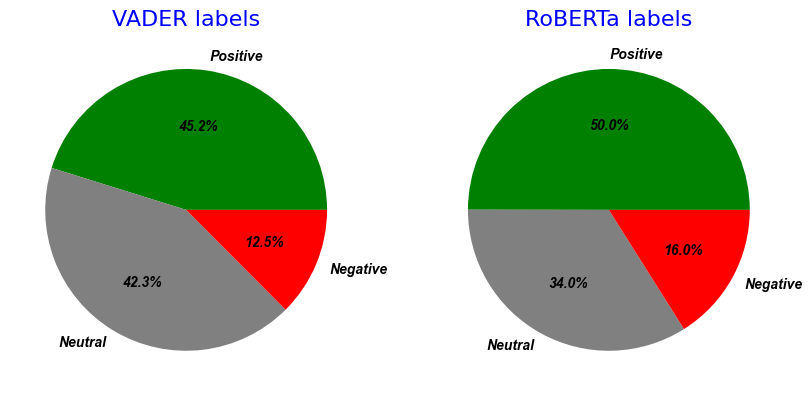

In [44]:
# creating a pie plots for count of sentiment labels
#pie charts visualisation format
plt.figure(figsize=(10, 6))
plt.subplot(121)
tweets_df["VADER_sentiment"].value_counts(normalize=True).to_frame().plot(
    ax=plt.gca(),
    kind="pie",
    autopct="%.1f%%",
    y="VADER_sentiment",
    colors=["green", "grey", "red"],
    **{
        "textprops": {
            "fontsize": 14,
            "font": "Arial",
            "fontstyle": "italic",
            "weight": "bold",
            "color": "black",
        }
    }
)
plt.legend().remove()
plt.title(
    "VADER labels",
    fontsize=16,
    color="blue",
)
plt.ylabel("")

# create the second pie plot
plt.subplot(122)
df_RoBERTa["RoBERTa_Sentiment"].value_counts(normalize=True).to_frame().plot(
    ax=plt.gca(),
    kind="pie",
    autopct="%.1f%%",
    y="RoBERTa_Sentiment",
    # figsize=(5, 6),
    colors=["green", "grey", "red"],
    **{
        "textprops": {
            "fontsize": 14,
            "font": "Arial",
            "fontstyle": "italic",
            "weight": "bold",
            "color": "black",
        }
    }
)
plt.legend().remove()
plt.title(
    "RoBERTa labels",
    fontsize=16,
    color="blue",
)
plt.ylabel("")
plt.show()

In [69]:
#save the file as cvs
df_RoBERTa_Model.to_csv(f'..//VADER_Model.csv')

In [27]:
#read the csv file
df_all_model = pd.read_csv('RoBERTa_newest.csv')

In [87]:
df_all_model.head(2)

,Unnamed: 0.1,Unnamed: 0,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens,...,Trigram,bi_phrase,tri_phrase,sentiment,Polarity,RoBERTa_Sentiment,VADER_content,VADER_scores,VADER_polarity,VADER_sentiment
0,0,0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...","['list', 'of', 'tokenized', 'tweets']",...,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...",subscribe poe pay tierget ready upgrade quora ...,s u b s c r i b e p o e p a y t i e r g ...,positive,0.0352,Positive,will you be subscribing to poe's paid tier?get...,"{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'comp...",0.7424,Positive
1,1,1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...","['list', 'of', 'tokenized', 'tweets']",...,"['elonmusk', 'fume', 'openai', 'become', 'mark...",elonmusk fume openai become market profitð cha...,e l o n m u s k f u m e o p e n a i b e ...,neutral,0.0087,Neutral,elonmusk fumes over openai becoming â$30b ma...,"{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'comp...",-0.0258,Neutral


In [88]:
df_all_model.drop(columns=['sentiment' ])

,Unnamed: 0.1,Unnamed: 0,Date,Source,Location,Tweet,Likes,Retweet,Tweet_lemmatized,Tokens,...,Bigram,Trigram,bi_phrase,tri_phrase,Polarity,RoBERTa_Sentiment,VADER_content,VADER_scores,VADER_polarity,VADER_sentiment
0,0,0,16/03/2023,Twitter Web App,United States,will you be subscribing to poe's paid tier?get...,0,0,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...","['list', 'of', 'tokenized', 'tweets']",...,"['subscribe', 'poe', 'pay', 'tierget', 'ready'...","['subscribe', 'poe', 'pay', 'tierget', 'ready'...",subscribe poe pay tierget ready upgrade quora ...,s u b s c r i b e p o e p a y t i e r g ...,0.0352,Positive,will you be subscribing to poe's paid tier?get...,"{'neg': 0.0, 'neu': 0.861, 'pos': 0.139, 'comp...",0.7424,Positive
1,1,1,16/03/2023,Twitter Web App,Dhaka-Bangladesh,#elonmusk fumes over #openai becoming â$30b ...,1,0,"['elonmusk', 'fume', 'openai', 'become', 'â30b...","['list', 'of', 'tokenized', 'tweets']",...,"['elonmusk', 'fume', 'openai', 'become', 'mark...","['elonmusk', 'fume', 'openai', 'become', 'mark...",elonmusk fume openai become market profitð cha...,e l o n m u s k f u m e o p e n a i b e ...,0.0087,Neutral,elonmusk fumes over openai becoming â$30b ma...,"{'neg': 0.091, 'neu': 0.909, 'pos': 0.0, 'comp...",-0.0258,Neutral
2,2,2,16/03/2023,Twitter for iPhone,Canada,with chatgpt4 the world will never be the same...,1,0,"['chatgpt4', 'world', 'never', 'current', 'ver...","['list', 'of', 'tokenized', 'tweets']",...,"['chatgpt', 'world', 'never', 'current', 'vers...","['chatgpt', 'world', 'never', 'current', 'vers...",chatgpt world never current version chatgpt bu...,c h a t g p t w o r l d n e v e r c u r ...,0.0087,Neutral,with chatgpt4 the world will never be the same...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neutral
3,3,3,16/03/2023,Twitter Web App,Bangladesh,a look inside autoblog gpt: reviewing the ai-d...,0,0,"['look', 'inside', 'autoblog', 'gpt', 'review'...","['list', 'of', 'tokenized', 'tweets']",...,"['look', 'inside', 'autoblog', 'gpt', 'review'...","['look', 'inside', 'autoblog', 'gpt', 'review'...",look inside autoblog gpt review aidriven blogg...,l o o k i n s i d e a u t o b l o g g p ...,0.0087,Neutral,a look inside autoblog gpt: reviewing the ai-d...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,Neutral
4,4,4,16/03/2023,Twitter Web App,Bangladesh,say goodbye to writer's block with autoblog gp...,0,0,"['say', 'goodbye', 'writer', 'block', 'autoblo...","['list', 'of', 'tokenized', 'tweets']",...,"['say', 'goodbye', 'writer', 'block', 'autoblo...","['say', 'goodbye', 'writer', 'block', 'autoblo...",say goodbye writer block autoblog gpt indepth ...,s a y g o o d b y e w r i t e r b l o c ...,-0.0133,Negative,say goodbye to writer's block with autoblog gp...,"{'neg': 0.112, 'neu': 0.888, 'pos': 0.0, 'comp...",-0.4404,Negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494262,494262,494262,04/01/2023,Unknown,Unknown,#lamda versus #chatgpt ?! who cares? lamda isn...,1,0,"['lamda', 'versus', 'chatgpt', 'care', 'lamda'...","['list', 'of', 'tokenized', 'tweets']",...,"['lamda', 'versus', 'chatgpt', 'care', 'lamda'...","['lamda', 'versus', 'chatgpt', 'care', 'lamda'...",lamda versus chatgpt care lamda isnt available...,l a m d a v e r s u s c h a t g p t c a ...,0.0352,Positive,lamda versus chatgpt ?! who cares? lamda isn't...,"{'neg': 0.109, 'neu': 0.679, 'pos': 0.212, 'co...",0.7191,Positive
494263,494263,494263,04/01/2023,Unknown,Unknown,#chatgpt so much #censorship. never trust a sy...,2,0,"['chatgpt', 'much', 'censorship', 'never', 'tr...","['list', 'of', 'tokenized', 'tweets']",...,"['chatgpt', 'much', 'censorship', 'never', 'tr...","['chatgpt', 'much', 'censorship', 'never', 'tr...",chatgpt much censorship never trust system don...,c h a t g p t m u c h c e n s o r s h i p ...,-0.0133,Negative,chatgpt so much censorship. never trust a syst...,"{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'comp...",-0.4023,Negativ

In [89]:
df_all_model.to_csv(f'..//df_all_model.csv')

In [98]:
#pip install vaderSentiment


In [19]:
#import library fron sklearn
from sklearn.metrics import accuracy_score, f1_score

In [22]:
#import library fron sklearn
from sklearn.metrics import precision_score, recall_score

In [23]:
#import classification report library fron sklearn
from sklearn.metrics import classification_report

In [17]:
#import library 
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [38]:
#perform the evaluation using the model performance metric
from sklearn.metrics import accuracy_score, f1_score
accu_score = accuracy_score(df_all_model['VADER_sentiment'],df_all_model['RoBERTa_Sentiment'])
print("Accuracy of RoBERTa", accu_score*100, "%")


Accuracy of RoBERTa 89.20077609874825 %


In [55]:
#print the evaluation report
print("Classification report")
print("......................")
print(classification_report(df_all_model['VADER_sentiment'],df_all_model['RoBERTa_Sentiment']))


Classification report
......................
              precision    recall  f1-score   support

    Negative       0.76      0.98      0.86     61962
     Neutral       0.97      0.78      0.86    208937
    Positive       0.88      0.98      0.93    223368

    accuracy                           0.89    494267
   macro avg       0.87      0.91      0.88    494267
weighted avg       0.90      0.89      0.89    494267



References:
Sentiment Analysis model: https://medium.com/@amanabdulla296/sentiment-analysis-with-vader-and-twitter-roberta-2ede7fb78909

https://github.com/hxycorn/Twitter-Sentiment-Analysis-about-ChatGPT![image-3.png](attachment:image-3.png)

Topic Modeling: https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0![image-2.png](attachment:image-2.png)

